# Exploración de los datos - Base obesidad

De forma introductoria, se revisara de manera descriptiva los datos suministrados en la base "Estimation of obseity level based on eating habits and physical condition" obtenida del repositorio UCI Machine Learning.

In [2]:
# Cargue de librerías
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

C:\Users\CARLOS MARIO\AppData\Local\Temp\ipykernel_12468\2097904997.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [3]:
datos = pd.read_csv("../Datos/ObesityDataSet_raw_and_data_sinthetic.csv")
datos.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [4]:
datos.describe()

,Age,Height,Weight,FCVC,NCP,CH2O,FAF,TUE
count,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000,2111.000000
mean,24.312600,1.701677,86.586058,2.419043,2.685628,2.008011,1.010298,0.657866
std,6.345968,0.093305,26.191172,0.533927,0.778039,0.612953,0.850592,0.608927
min,14.000000,1.450000,39.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,19.947192,1.630000,65.473343,2.000000,2.658738,1.584812,0.124505,0.000000
50%,22.777890,1.700499,83.000000,2.385502,3.000000,2.000000,1.000000,0.625350
75%,26.000000,1.768464,107.430682,3.000000,3.000000,2.477420,1.666678,1.000000
max,61.000000,1.980000,173.000000,3.000000,4.000000,3.000000,3.000000,2.000000


Se cuenta con un set de variables cualitativas y cuantitativas, por lo cual para la parte del análisis descriptivo preliminar se tomaran de manera separada los conjuntos de datos según su naturaleza.

In [25]:
categorical= datos[["Gender","family_history_with_overweight", "FAVC","SMOKE", "SCC","CAEC","CALC",'MTRANS',"NObeyesdad"]]
numerical_columns = datos[["Age","Weight","Height", "FCVC", "NCP", "CH2O", "FAF","TUE","NObeyesdad"]]
numerical_columns.head()


,Age,Weight,Height,FCVC,NCP,CH2O,FAF,TUE,NObeyesdad
0,21.0,64.0,1.62,2.0,3.0,2.0,0.0,1.0,Normal_Weight
1,21.0,56.0,1.52,3.0,3.0,3.0,3.0,0.0,Normal_Weight
2,23.0,77.0,1.80,2.0,3.0,2.0,2.0,1.0,Normal_Weight
3,27.0,87.0,1.80,3.0,3.0,2.0,2.0,0.0,Overweight_Level_I
4,22.0,89.8,1.78,2.0,1.0,2.0,0.0,0.0,Overweight_Level_II


Sobre el conjunto de datos de variables numéricas, se tiene la hipótesis que la estatura y el peso estan altamente correlaccionadas con nivel de obesidad. En primera instancia, se presenta el siguiente diagrama de dispersión

<Axes: xlabel='Weight', ylabel='Height'>

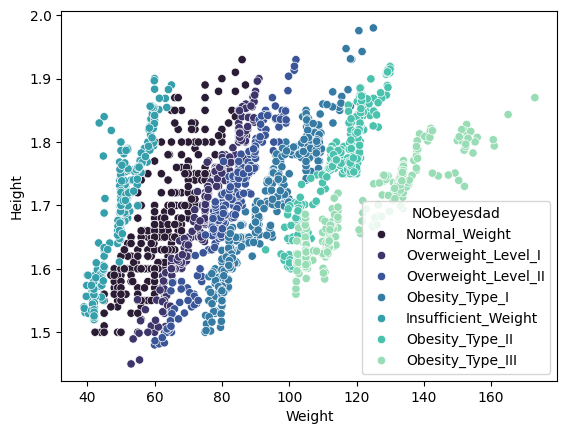

In [22]:
sns.scatterplot(data=numerical_columns,x='Weight',y='Height',hue='NObeyesdad',palette="mako")

Es notorio que los niveles más altos de obesidad estan determinados por un mayor peso, si bien la altura parece no tener una tendencia marcada, se sabe que el indíce de masa corporal es determinado por estas dos variables por lo que puede tener una influencia clara en los casos de obesidad, para validar el supuesto se crea la variable IMC, así como se transforma la variable 'NObesyesdad' en 2 variables:
- obseidad_2: Si la variable 'NObeyesdad' es igual a Obesidad tipo I, II o III entonces 1, de lo contrario 0
- obesidad_3: Si la variable 'NObeyesdad' es igual Obesidad tipo I,II o III entonces 2,sino, si la variable 'NObeyesdad' es igual Sobrepeso I o II entonces 1, de lo contrario 0.

In [26]:
numerical_columns['IMC']=numerical_columns['Weight']/(numerical_columns['Height']**2)
numerical_columns['obesidad_2']= numerical_columns['NObeyesdad'].map({'Normal_Weight': 0, 'Insufficient_Weight': 0, 'Overweight_Level_I':0,'Overweight_Level_II':0, 'Obesity_Type_I':1,'Obesity_Type_II':1, 'Obesity_Type_III':1})
numerical_columns['obesidad_3']= numerical_columns['NObeyesdad'].map({'Normal_Weight': 0, 'Insufficient_Weight': 0, 'Overweight_Level_I':1,'Overweight_Level_II':1, 'Obesity_Type_I':2,'Obesity_Type_II':2, 'Obesity_Type_III':2})
numerical_columns=numerical_columns.drop('NObeyesdad',axis=1)
numerical_columns.head()

C:\Users\CARLOS MARIO\AppData\Local\Temp\ipykernel_12468\3766957394.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  numerical_columns['IMC']=numerical_columns['Weight']/(numerical_columns['Height']**2)
C:\Users\CARLOS MARIO\AppData\Local\Temp\ipykernel_12468\3766957394.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  numerical_columns['obesidad_2']= numerical_columns['NObeyesdad'].map({'Normal_Weight': 0, 'Insufficient_Weight': 0, 'Overweight_Level_I':0,'Overweight_Level_II':0, 'Obesity_Type_I':1,'Ob

,Age,Weight,Height,FCVC,NCP,CH2O,FAF,TUE,IMC,obesidad_2,obesidad_3
0,21.0,64.0,1.62,2.0,3.0,2.0,0.0,1.0,24.386526,0,0
1,21.0,56.0,1.52,3.0,3.0,3.0,3.0,0.0,24.238227,0,0
2,23.0,77.0,1.80,2.0,3.0,2.0,2.0,1.0,23.765432,0,0
3,27.0,87.0,1.80,3.0,3.0,2.0,2.0,0.0,26.851852,0,1
4,22.0,89.8,1.78,2.0,1.0,2.0,0.0,0.0,28.342381,0,1


In [7]:
numerical_columns.corr()

,Age,Weight,Height,FCVC,NCP,CH2O,FAF,TUE,IMC,obesidad_2,obesidad_3
Age,1.000000,0.202560,-0.025958,0.016291,-0.043944,-0.045304,-0.144938,-0.296931,0.244163,0.217473,0.308309
Weight,0.202560,1.000000,0.463136,0.216125,0.107469,0.200575,-0.051436,-0.071561,0.934806,0.793652,0.848079
Height,-0.025958,0.463136,1.000000,-0.038121,0.243672,0.213376,0.294709,0.051912,0.131785,0.137413,0.144356
FCVC,0.016291,0.216125,-0.038121,1.000000,0.042216,0.068461,0.019939,-0.101135,0.263651,0.174848,0.113146
NCP,-0.043944,0.107469,0.243672,0.042216,1.000000,0.057088,0.129504,0.036326,0.039969,0.037004,-0.034655
CH2O,-0.045304,0.200575,0.213376,0.068461,0.057088,1.000000,0.167236,0.011965,0.144200,0.097423,0.135521
FAF,-0.144938,-0.051436,0.294709,0.019939,0.129504,0.167236,1.000000,0.058562,-0.177537,-0.147097,-0.178033
TUE,-0.296931,-0.071561,0.051912,-0.101135,0.036326,0.011965,0.058562,1.000000,-0.099720,-0.082742,-0.101004
IMC,0.244163,0.934806,0.131785,0.263651,0.039969,0.144200,-0.177537,-0.099720,1.000000,0.837348,0.899612
obesidad_2,0.217473,0.793652,0.137413,0.174848,0.037004,0.097423,-0.147097,-0.082742,0.837348,1.000000,0.896501


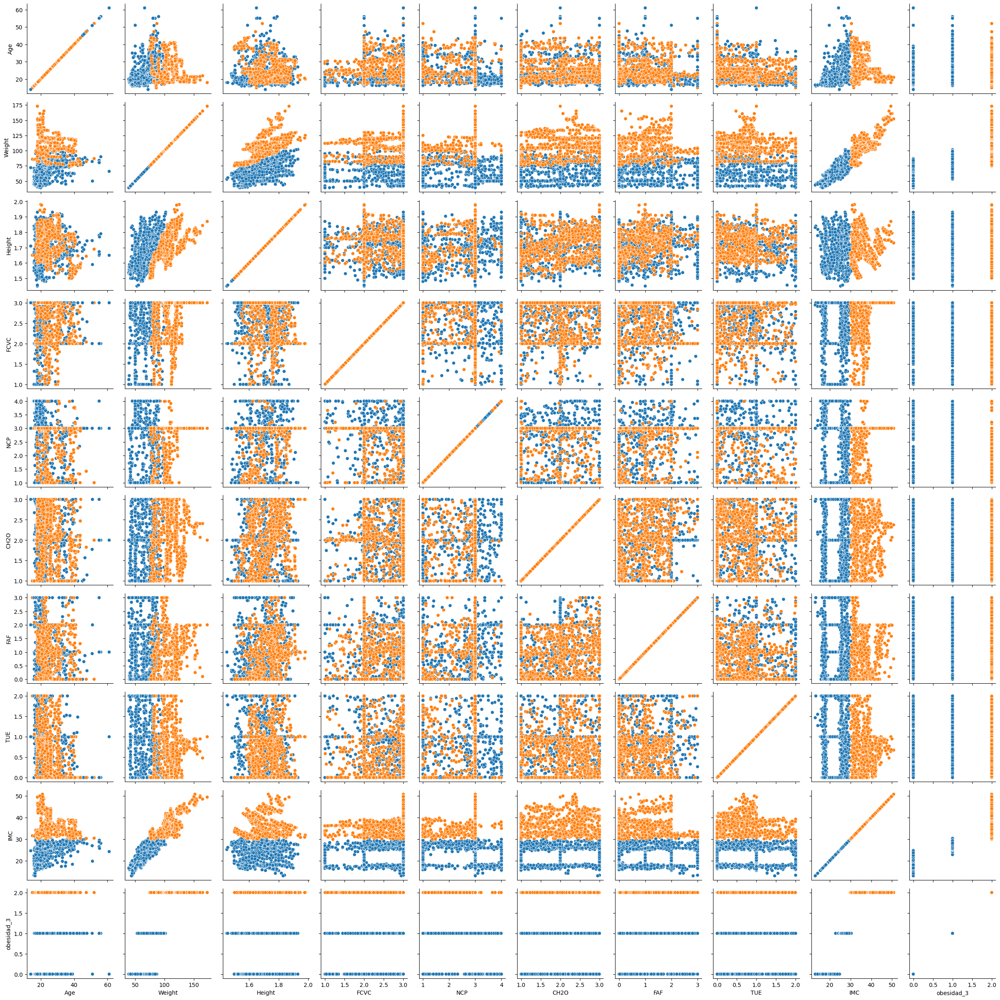

In [20]:
graphs=sns.PairGrid(numerical_columns, hue='obesidad_2', palette="mako")
graphs.map(sns.scatterplot)

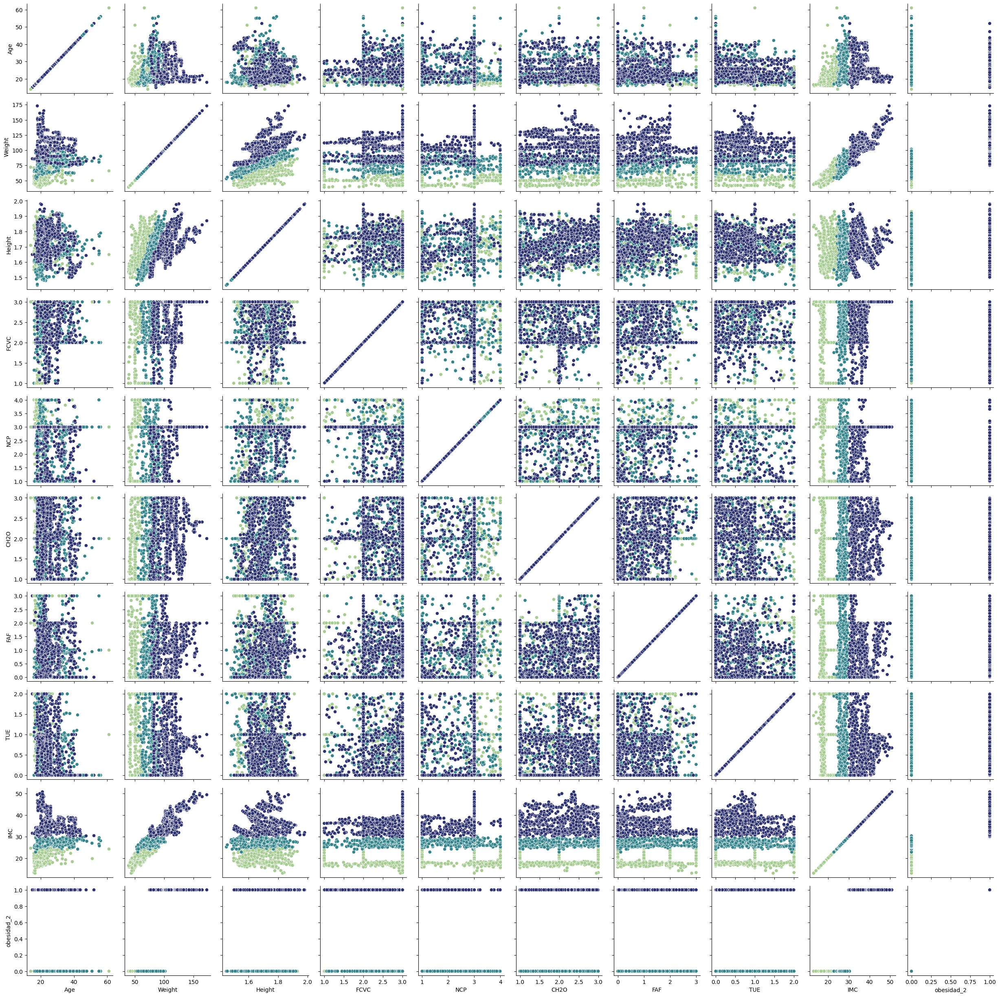

In [21]:
graphs=sns.PairGrid(numerical_columns, hue='obesidad_3',palette="crest")
graphs.map(sns.scatterplot)

Como se esperaba, la correlación más alta de la variable obesidad se encuentra con las variables IMC y Peso, si bien la correlación con la variable altura es débil pero su influencia en el IMC hace que los modelos a plantear puedan estar sesgados por estas variables, por esta razón se opta por excluirlas dentro del conjunto de datos.

Se repite el ejercicio sin las variables IMC, Height y Weight con el fin de determinar si existe relevancia entre tomar la variable respuesta Obsesidad con 2 o tres niveles.

In [27]:
numerical_columns= numerical_columns.drop('Weight', axis=1)
numerical_columns= numerical_columns.drop('Height', axis=1)
numerical_columns= numerical_columns.drop('IMC', axis=1)
numerical_columns.head()

,Age,FCVC,NCP,CH2O,FAF,TUE,obesidad_2,obesidad_3
0,21.0,2.0,3.0,2.0,0.0,1.0,0,0
1,21.0,3.0,3.0,3.0,3.0,0.0,0,0
2,23.0,2.0,3.0,2.0,2.0,1.0,0,0
3,27.0,3.0,3.0,2.0,2.0,0.0,0,1
4,22.0,2.0,1.0,2.0,0.0,0.0,0,1


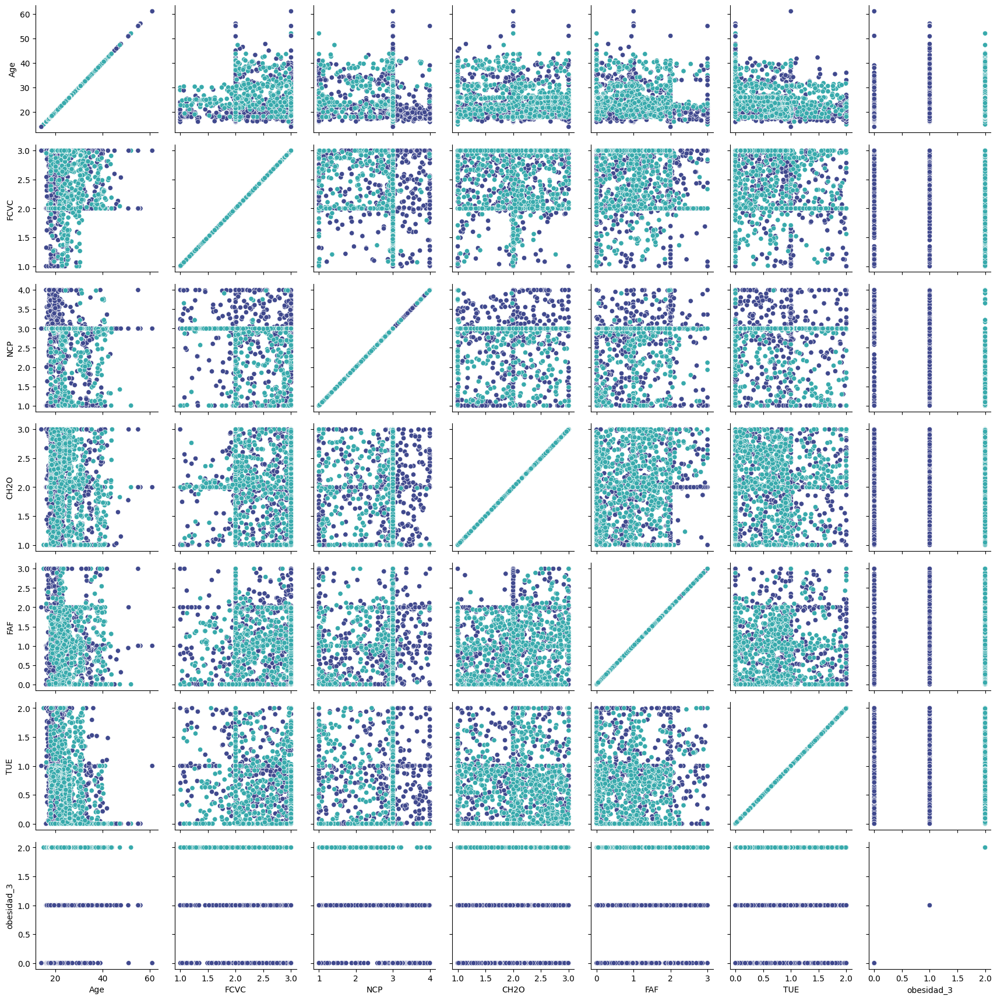

In [15]:
graphs=sns.PairGrid(numerical_columns, hue='obesidad_2', palette="mako")
graphs.map(sns.scatterplot)

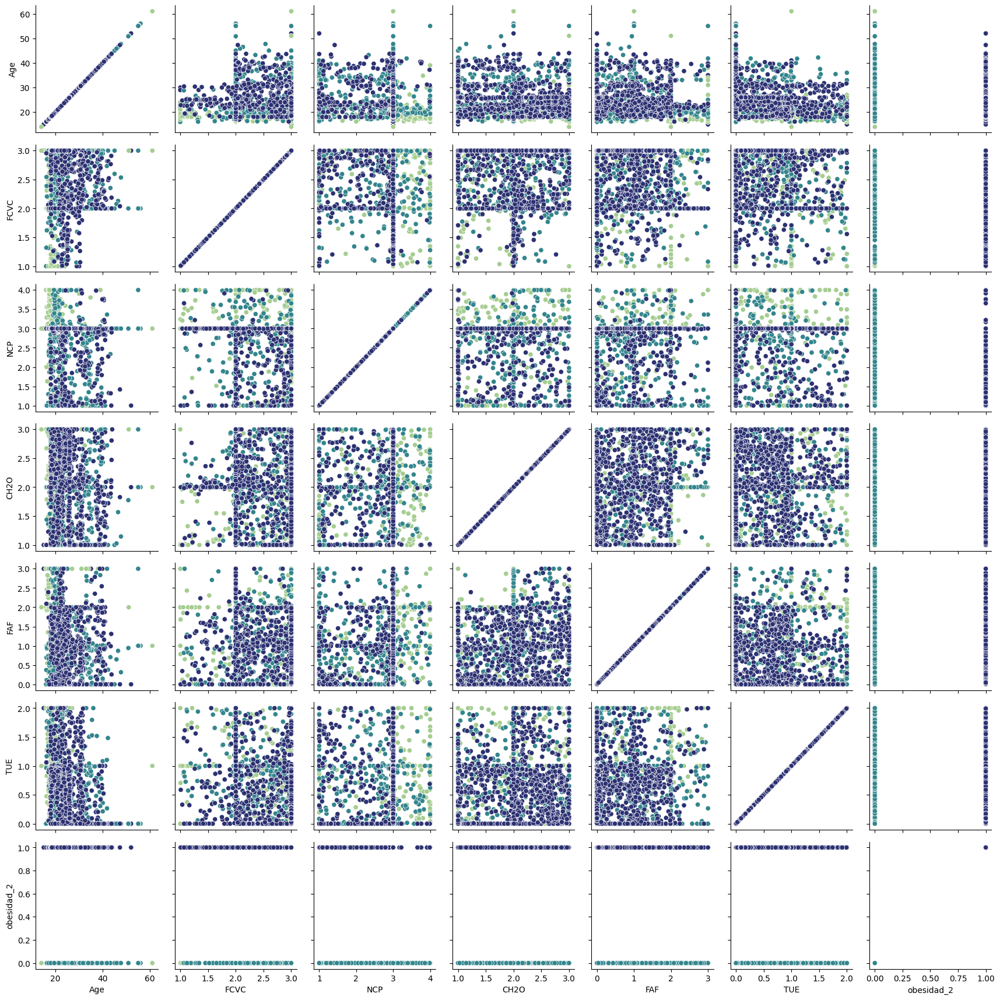

In [17]:
graphs=sns.PairGrid(numerical_columns, hue='obesidad_3',palette="crest")
graphs.map(sns.scatterplot)

Se puede observar que al graficar la correlación de las variables identificando la variable obesidad con 2 y con 3 estados, no se aprecia una diferencia relevante tras excluir las variables de peso y altura. Como el objetivo del trabajo es determinar grupos que permitan identificar patrones que determinen la obesidad, se opta por usar la variable 'obesidad_2'.

# Clustering

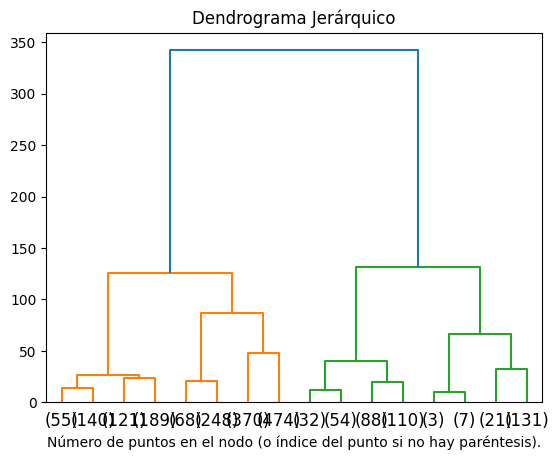

In [32]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

X=numerical_columns
clustering = AgglomerativeClustering(n_clusters=None, distance_threshold=0).fit(X)

def plot_dendrogram(model, **kwargs):
    # Crear el conteo de muestras bajo cada nodo
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # es una hoja
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)

    # Trazar el dendrograma correspondiente
    dendrogram(linkage_matrix, **kwargs)

# Trazar el dendrograma
plt.title('Dendrograma Jerárquico')
plot_dendrogram(clustering, truncate_mode='level', p=3)
plt.xlabel("Número de puntos en el nodo (o índice del punto si no hay paréntesis).")
plt.show()
